# Grouping Time Series Labels - An Anomaly Detection Example with Space Shuttle Data

In this notebook, we demonstrate how MIEDA can be used to aggregate time-series labels across multiple streams of data. Aggregating labels across time-series data provides a number of benefits across a variety of scenarios: 

- The ability to rapidly identify time ranges in which the time-series data considered share a common label, and relatedly, which time periods exhibit the greatest amount of label-commonality between the time-series. 
- The ability to easily identify which time-series telemetry stream(s) are leading indicators of cross-time-series anomalies by locating time-series with the greatest interval length prior to the time period where anomaly detections are shared across many time-series. 

In this notebook, we utilize [a dataset from the NASA Space Shuttle program](https://archive.ics.uci.edu/ml/datasets/Statlog+%28Shuttle%29) made available by Jason Catlett of the Basser Department of Computer Science at the University of Sydney, downloadable from the University of California Irvine's Center for Machine Learning and Intelligent Systems Machine Learning Repository. The dataset contains several time-series data with the labels `Rad Flow`, `Fpv Close`, `Fpv Open`, `High`, `Bypass`, `Bpv Close`, and `Bpv Open`, with approximately 80% of the data belonging to class 1. While the original dataset is chronologically ordered, the observations this dataset have been randomized prior to being made available. Time order is certainly useful in the purposes of anomaly detection, it is not necessary here for performing a simple anomaly detection exercise for the purposes of showcasing MIEDA's utility in these use cases. Additionally, we do not aim to solve the anomaly detection task here with great accuracy and simply use the dataset to illustrate MIEDA's capabilities. 

## Imports

In [1]:
# let's make sure we are using the correct kernel 
import sys; sys.executable

'/Users/vconstan/Files/Projects/mieda/mieda/venv/bin/python'

In [2]:
from mieda.intervals import Merge

In [41]:
import dill
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np 
import pandas as pd
pd.options.mode.chained_assignment = None
import pathlib
from PyNomaly import loop
import seaborn as sns

## Read Data

The data may be downloaded from [the University of California Irvine's Center for Machine Learning and Intelligent Systems Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/Statlog+%28Shuttle%29) and extracted to the `data` directory at the root of this repository. We utilize `shuttle/shuttle.trn` in these examples, but as unsupervised methods are used for anomaly detection here, one may combine this training set with the testing set for a more comprehensive example, `shuttle/shuttle.tst`. 

In [4]:
data_src = pathlib.Path("../data/shuttle/shuttle.trn")
columns = ["Time", "Rad Flow", "Fpv Close", "Fpv Open", "High", "Bypass", "Bpv Close", "Bpv Open", "Class"]

In [5]:
shuttle_df = pd.read_csv(data_src, delimiter=' ', names=columns).sort_values(by="Time", ascending=True)
shuttle_df.head()

,Time,Rad Flow,Fpv Close,Fpv Open,High,Bypass,Bpv Close,Bpv Open,Class
37,-4821,77,0,20,-1,40,56,16,7
37,-4624,76,3,36,4,39,40,2,7
37,-4475,106,-4,30,17,69,75,6,7
37,-4184,106,40,34,-10,69,72,4,7
37,-4048,105,0,36,0,68,69,0,1


In [6]:
shuttle_df.shape

(43500, 9)

## Examine the Data 

We visualize some of the time-series data in order to gain an understanding of when anomalies may occur. While complex anomalies exist in time-series data, e.g. contextual and collective anomalies [Chandola, Banerjee, Kumar. 2009](https://www.doi.org/10.1145/1541880.1541882), in these examples we only concern ourselves with point anomalies for the purposes of showcasing MIEDA's utility, or anomalies which shift from the data's normal distribution. We will subsequently apply an anomaly detection approach individually on each time-series and collate the results using MIEDA. 

First, let's plot the pairwise relationships between some of the time-series available within the Shuttle dataset. 

In [7]:
def plot_time_series(dataframe: 'pd.DataFrame', column_1_name: str, column_2_name: str = None) -> None:
    plt.cla()
    plt.clf()
    fig = plt.figure(figsize=(350,7))
    ax = plt.axes()
    ax.plot(range(0, dataframe.shape[0]), dataframe[column_1_name])
    if column_2_name is not None:
        ax.plot(range(0, dataframe.shape[0]), dataframe[column_2_name], color="r")
        plt.ylabel(column_1_name + " (blue), " + column_2_name + " (red)", labelpad=20)
    else:
        plt.ylabel(column_1_name + " (blue)", labelpad=20)
    plt.xlabel("Time", labelpad=20)
    plt.rcParams["font.size"] = "15"

<Figure size 432x288 with 0 Axes>

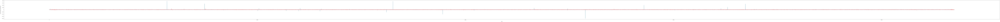

In [8]:
plot_time_series(shuttle_df, "Fpv Close", "Fpv Open")

<Figure size 432x288 with 0 Axes>

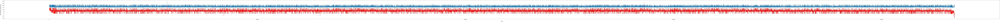

In [9]:
plot_time_series(shuttle_df, "Rad Flow", "Bypass") 

<Figure size 432x288 with 0 Axes>

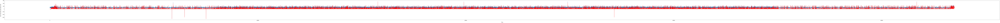

In [10]:
plot_time_series(shuttle_df, "Bpv Close", "Bpv Open")

While many of the abormalities seen visually in the above dataset occur within a single time-series and in isolation from other time-series in the dataset, there are instances where values that seem to drift from normal values occur at approximately the same time across multiple time-series in the Shuttle dataset, some of which may be leading indicators. We can thus utilize this dataset to showcase how MIEDA can be used practically in this sort of application, even if the number of detections and time-series data are small and do not showcase MIEDA's scalability (see [INSERT LINK TO NOTEBOOK HERE]() for an illustration of MIEDA's scalability). 

## Detecting Anomalies 

For the purposes of anomaly detection, we utilize the [PyNomaly]() Python library ([Constantinou, 2018]()) which is an implementation of an approach called Local Outlier Probabilities (LoOP) ([Kriegel H., Kröger P., Schubert E., Zimek A., 2009](http://www.dbs.ifi.lmu.de/Publikationen/Papers/LoOP1649.pdf)). This approach is a local density based outlier detection method providing an outlier “score” in the range of [0, 1] that is directly interpretable as a probability of a data object for being an outlier. While not suitable for collective or contextual anomalies, this approach works well for point anomalies which fall outside of the normal distribution of the data considered. We'll start with examining how this will be done using the time-series `Rad Flow`. 

### Single Time-Series 

In [11]:
shuttle_df_subset = shuttle_df.iloc[5000:10000].reset_index()

In [12]:
clf = loop.LocalOutlierProbability(shuttle_df_subset["Rad Flow"].values, n_neighbors=10, progress_bar=True, use_numba=True)
anom_scores = clf.fit().local_outlier_probabilities

[ ================================================================================ ] 100.00%

In [13]:
# take a quick peek at the scores 
anom_scores[2550:2650]

array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], dtype=object)

In [14]:
# top scores
TOP_N = 10
top_idx = np.argsort(anom_scores)[-TOP_N:]
top_scores = anom_scores[top_idx]
top_scores

array([0.34401667704213185, 0.34401667704213185, 0.34401667704213185,
       0.3900548711147946, 0.6838001055849268, 0.6838001055849268,
       0.6838001055849268, 0.6838001055849268, 0.7655246875574411, 1.0],
      dtype=object)

In [15]:
top_idx

array([4016, 2065, 1504, 3457,  445, 4366, 4055, 1343, 3379,  659])

In [16]:
def plot_time_series_top_anomalies(dataframe: 'pd.DataFrame', column_name: str, anom_idx: list) -> None:
    plt.cla()
    plt.clf()
    fig = plt.figure(figsize=(350,7))
    ax = plt.axes()
    ax.plot(range(0, dataframe.shape[0]), dataframe[column_name])
    ax.plot(anom_idx, dataframe[column_name].values[anom_idx], "o", color="red")
    plt.ylabel(column_name + " (blue)", labelpad=20)
    plt.xlabel("Time", labelpad=20)
    plt.rcParams["font.size"] = "15"

<Figure size 432x288 with 0 Axes>

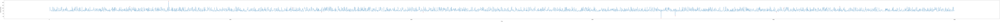

In [17]:
plot_time_series_top_anomalies(shuttle_df_subset, "Rad Flow", top_idx)

In order to label point observations in the time-series as anomalous, we must determine a suitable threshold in which to create a binary classification: `nominal` versus `anomalous`. We can visualize the distribution of the anomaly scores as an aid in determining the ideal cut-off value in which to label individual observations as anomalous or not. For the purposes of a visual aid, we will exclude any 0 values. 

In [18]:
nonzero_anom_scores = [score for score in anom_scores if score != 0.]

Text(0.5, 1.0, 'Distribution of Non-Zero Anomaly Scores\n')

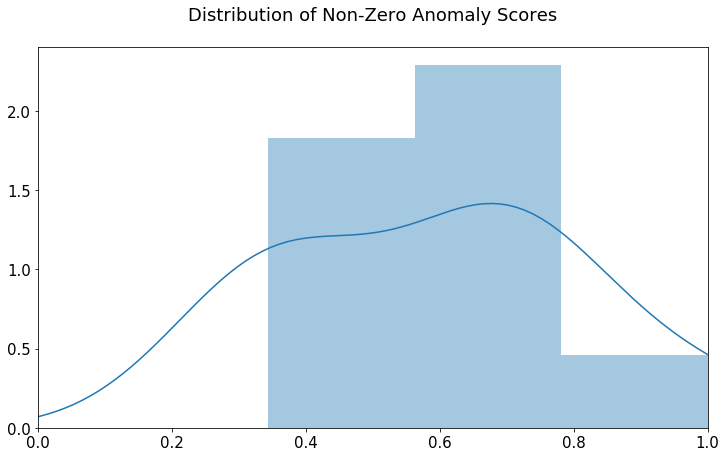

In [19]:
plt.figure(figsize=(12,7))
g = sns.distplot(nonzero_anom_scores)
g.set(xlim=(0, 1))
ax = plt.gca()
ax.set_title('Distribution of Non-Zero Anomaly Scores\n')

From the distribution above, it looks like we could use 0.7 as a cut-off value for safely identifying anomalies within the `Rad Flow` time series. We will later repeat this exercise across all the time-series to determine the ideal cut-off value for assigning `nominal` versus `anomalous` labels to each of the time-series. 

In [20]:
THRESHOLD = 0.7

In [21]:
shuttle_df_subset.head()

,index,Time,Rad Flow,Fpv Close,Fpv Open,High,Bypass,Bpv Close,Bpv Open,Class
0,44,-2,79,0,44,6,35,35,0,1
1,53,-2,79,0,52,-19,26,27,2,1
2,44,-2,85,0,44,5,41,41,0,1
3,45,-2,86,0,44,-23,40,42,2,1
4,37,-2,108,-4,26,0,71,82,12,1


In [22]:
# label the point anomalies for RadFlow
shuttle_df_subset["Rad Flow Anomaly"] = [False for i in range(0, shuttle_df_subset.shape[0])]
shuttle_df_subset["Rad Flow Anomaly Score"] = anom_scores
shuttle_df_subset["Rad Flow Anomaly"] = shuttle_df_subset["Rad Flow Anomaly Score"] > THRESHOLD

In [23]:
shuttle_df_subset_anoms = shuttle_df_subset[shuttle_df_subset["Rad Flow Anomaly"] == True]
shuttle_df_subset_anoms

,index,Time,Rad Flow,Fpv Close,Fpv Open,High,Bypass,Bpv Close,Bpv Open,Class,Rad Flow Anomaly,Rad Flow Anomaly Score
659,45,-1,149,3830,44,0,105,105,0,1,True,1
3379,55,0,29,-194,-22,0,-26,52,78,5,True,0.765525


In [24]:
shuttle_df_subset_anoms_idx = shuttle_df_subset_anoms.index.values
shuttle_df_subset_anoms_idx

array([ 659, 3379])

MIEDA is well suited for anomaly detection use cases involving contextual or collective anomalies which occur throughout a span of time, e.g. t0 to t10. While the anomalies detected here are point anomalies, we can create a window around the anomaly detections for the purposes of showcasing MIEDA's capabilities. We define a `buffer` size (integer) for creating the labeled windows, with each window around a detected point anomaly existing within the range [buffer - anomaly_index, anomaly_index + buffer].

In [25]:
BUFFER_SIZE = 20

In [26]:
anom_windows = [[idx - BUFFER_SIZE, idx + BUFFER_SIZE] for idx in shuttle_df_subset_anoms_idx]
anom_windows

[[639, 679], [3359, 3399]]

In [27]:
def plot_time_series_windows(dataframe: 'pd.DataFrame', column_name: str, anom_idx: list, windows: list, display_mode: bool = False) -> None:
    plt.cla()
    plt.clf()
    fig = plt.figure(figsize=(350,7))
    ax = plt.axes()
    ax.plot(range(0, dataframe.shape[0]), dataframe[column_name])
    ax.plot(anom_idx, dataframe[column_name].values[anom_idx], "o", color="red")
    y_min, y_max = plt.gca().get_ylim() 
    for w in windows:
        ax.fill_between(w, y_min, y_max, where=w,
                facecolor='yellow', alpha=0.3)
    plt.ylabel(column_name + " (blue)", labelpad=20)
    plt.xlabel("Time", labelpad=20)
    plt.rcParams["font.size"] = "15"
    
    if display_mode is True:
        display.display(fig)
        display.clear_output(wait=True)

<Figure size 432x288 with 0 Axes>

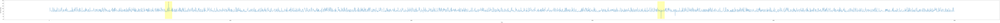

In [28]:
plot_time_series_windows(shuttle_df_subset, "Rad Flow", shuttle_df_subset_anoms_idx, windows=anom_windows)

Now that we have a simple anomaly detection approach in place with labeled windows of anomalies, we can extend this approach to the other time-series in the Shuttle dataset and illustrate how MIEDA can be used in this area. 

### Multiple Time Series

In order to showcase MIEDA's utility, we will need anomaly scores for each of the time series in the shuttle dataset and the windows in which we label the time series as anomalous. We will setup a dictionary to store the windows and point values of detected anomalies which will serve as a basis to construct intervals which can be fed into MIEDA for merging. 

In [29]:
def process_time_series(dataframe, columns, use_numba: bool = False):

    time_series = dict()
    for ts in columns:

        print("\n------ " + ts + " ------")

        time_series[ts] = {
            "anom_scores": None, 
            "anom_idx": None, 
            "all_scores": None,
            "anom_windows": None
        }

        clf = loop.LocalOutlierProbability(dataframe[ts].values, n_neighbors=10, progress_bar=True, use_numba=use_numba)
        anom_scores = clf.fit().local_outlier_probabilities
        time_series[ts]["all_scores"] = anom_scores

        TOP_N = 10
        top_idx = np.argsort(anom_scores)[-TOP_N:]
        time_series[ts]["anom_idx"] = top_idx
        top_scores = anom_scores[top_idx]
        time_series[ts]["anom_scores"] = top_scores

        THRESHOLD = 0.4
        dataframe[ts + " Anomaly"] = [False for i in range(0, dataframe.shape[0])]
        dataframe[ts + " Anomaly Score"] = anom_scores
        dataframe[ts + " Anomaly"] = dataframe[ts + " Anomaly Score"] > THRESHOLD
        dataframe_anoms = dataframe[dataframe[ts + " Anomaly"] == True]
        dataframe_anoms_idx = dataframe_anoms.index.values

        BUFFER_SIZE = 20
        anom_windows = [[idx - BUFFER_SIZE, idx + BUFFER_SIZE] for idx in dataframe_anoms_idx]
        time_series[ts]["anom_windows"] = anom_windows

        # TODO: Remove display mode 
        plot_time_series_windows(dataframe, ts, dataframe_anoms_idx, windows=anom_windows, display_mode=False)
        
        plt.show()
        
    return time_series

In [30]:
time_series_names = columns
for x in ["Time", "Class"]:
    try:
        time_series_names.remove(x)
    except ValueError:
        pass


------ Rad Flow ------
[ ================================================================================ ] 100.00%

<Figure size 432x288 with 0 Axes>

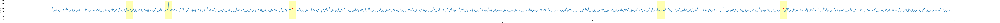


------ Fpv Close ------
[ ================================================================================ ] 100.00%

<Figure size 432x288 with 0 Axes>

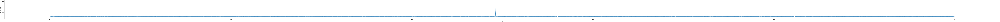


------ Fpv Open ------
[ ================================================================================ ] 100.00%

<Figure size 432x288 with 0 Axes>

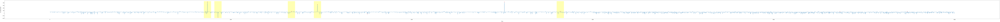


------ High ------
[ ================================================================================ ] 100.00%

<Figure size 432x288 with 0 Axes>

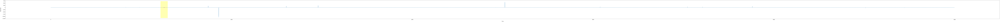


------ Bypass ------
[ ================================================================================ ] 100.00%

<Figure size 432x288 with 0 Axes>

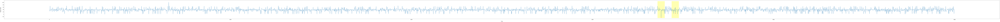


------ Bpv Close ------
[ ================================================================================ ] 100.00%

<Figure size 432x288 with 0 Axes>

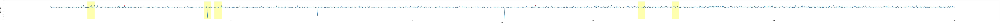


------ Bpv Open ------
[ ================================================================================ ] 100.00%

<Figure size 432x288 with 0 Axes>

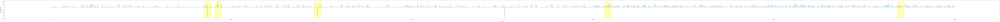

In [31]:
run_info = process_time_series(shuttle_df_subset, columns=time_series_names, use_numba=True)

It's clear that there is ample room for improvement from the shown output as far as anomaly detection is concerned, but it is evident regardless that the time series do share anomalies detected at approximately the same time range at various indices. We can use MIEDA to collate the ranges from all the time series into a new list of intervals for later use, one of its use cases. MIEDA makes it easy to collate information from a large number of time series - in this case however only 7 time series however. 

In [32]:
run_info

{'Rad Flow': {'anom_scores': array([0.34401667704213185, 0.34401667704213185, 0.34401667704213185,
         0.3900548711147946, 0.6838001055849268, 0.6838001055849268,
         0.6838001055849268, 0.6838001055849268, 0.7655246875574411, 1.0],
        dtype=object),
  'anom_idx': array([4016, 2065, 1504, 3457,  445, 4366, 4055, 1343, 3379,  659]),
  'all_scores': array([0.0, 0.0, 0.0, ..., 0.0, 0.0, 0.0], dtype=object),
  'anom_windows': [[425, 465],
   [639, 679],
   [1323, 1363],
   [3359, 3399],
   [4035, 4075],
   [4346, 4386]]},
 'Fpv Close': {'anom_scores': array([2.418177856257562e-07, 2.561471462178154e-07,
         2.8462274556714014e-07, 2.9599154882719914e-07,
         3.326555479141931e-07, 3.697734585648715e-07,
         3.8886995146324067e-07, 6.231868130520182e-07,
         7.17193364080671e-07, 1.0], dtype=object),
  'anom_idx': array([2894, 2806, 3545, 4115, 2464, 3175, 3457, 3379,  659, 3666]),
  'all_scores': array([0.0, 0.0, 0.0, ..., 0.0, 0.0, 0.0], dtype=object),
 

In [42]:
# let's save that object 
with open("../data/shuttle/run_info.pkl", "wb") as dill_file:
    dill.dump(run_info, dill_file)

In [43]:
# load the object 
with open("../data/shuttle/run_info.pkl", "rb") as dill_file:
    run_info = dill.load(dill_file)

In [35]:
# create intervals for input to MIEDA 
intervals = list()
for ts in run_info:
    for w in run_info[ts]["anom_windows"]:
        intervals.append(
            {"start": w[0], "finish": w[1], "time_series": {ts}}
        )
# sort by start and then end time 
intervals = sorted(intervals, key = lambda i: (i['start'], i['finish'])) 

In [36]:
intervals

[{'start': 207, 'finish': 247, 'time_series': {'Bpv Close'}},
 {'start': 392, 'finish': 432, 'time_series': {'Bpv Close'}},
 {'start': 425, 'finish': 465, 'time_series': {'Rad Flow'}},
 {'start': 607, 'finish': 647, 'time_series': {'High'}},
 {'start': 639, 'finish': 679, 'time_series': {'Rad Flow'}},
 {'start': 851, 'finish': 891, 'time_series': {'Fpv Open'}},
 {'start': 851, 'finish': 891, 'time_series': {'Bpv Close'}},
 {'start': 851, 'finish': 891, 'time_series': {'Bpv Open'}},
 {'start': 909, 'finish': 949, 'time_series': {'Fpv Open'}},
 {'start': 909, 'finish': 949, 'time_series': {'Bpv Close'}},
 {'start': 909, 'finish': 949, 'time_series': {'Bpv Open'}},
 {'start': 1276, 'finish': 1316, 'time_series': {'Bpv Close'}},
 {'start': 1315, 'finish': 1355, 'time_series': {'Fpv Open'}},
 {'start': 1323, 'finish': 1363, 'time_series': {'Rad Flow'}},
 {'start': 1459, 'finish': 1499, 'time_series': {'Fpv Open'}},
 {'start': 1459, 'finish': 1499, 'time_series': {'Bpv Open'}},
 {'start': 17

In [37]:
merged_intervals = Merge.union(intervals=intervals, key="time_series")

The merged intervals now contain periods where only one of the sensors is anomalous and intervals where more than one sensor is anomalous at the time indicated by the `start` and `finish` keys. Additionally, there is at least one example where an anomaly in the data occurs prior to one in another times series at not exact but approximately close times - one could use a simple script (illustrated in the following section) to find instances where an anomaly in a time series occurs as a precursor to other anomalies in related time series. 

In [38]:
for mi in merged_intervals:
    print(mi)

{'start': 207, 'finish': 247, 'time_series': {'Bpv Close'}}
{'start': 392, 'finish': 425, 'time_series': {'Bpv Close'}}
{'start': 425, 'finish': 432, 'time_series': {'Bpv Close', 'Rad Flow'}}
{'start': 432, 'finish': 465, 'time_series': {'Rad Flow'}}
{'start': 607, 'finish': 639, 'time_series': {'High'}}
{'start': 639, 'finish': 647, 'time_series': {'Rad Flow', 'High'}}
{'start': 647, 'finish': 679, 'time_series': {'Rad Flow'}}
{'start': 851, 'finish': 891, 'time_series': {'Fpv Open', 'Bpv Open', 'Bpv Close'}}
{'start': 909, 'finish': 949, 'time_series': {'Fpv Open', 'Bpv Open', 'Bpv Close'}}
{'start': 1276, 'finish': 1315, 'time_series': {'Bpv Close'}}
{'start': 1315, 'finish': 1316, 'time_series': {'Fpv Open', 'Bpv Close'}}
{'start': 1316, 'finish': 1323, 'time_series': {'Fpv Open'}}
{'start': 1323, 'finish': 1355, 'time_series': {'Fpv Open', 'Rad Flow'}}
{'start': 1355, 'finish': 1363, 'time_series': {'Rad Flow'}}
{'start': 1459, 'finish': 1499, 'time_series': {'Fpv Open', 'Bpv Open

### Identifying Precursor Anomalies (Leading Indicators)

We'll define an anomaly as a _precursor_ here as an anomaly within a specific time-series that occurs in isolation prior to sharing overlaps with other anomalous time series at later times. E.g., if A occurs and later A, B, and C occur together with continuity in indices (e.g. A does not stop before [A, B, C].)

In [39]:
sequence_intervals = list()
for i in reversed(range(0, len(merged_intervals)-1)):
    # if the sequence is continuing
    if merged_intervals[i]["finish"] == merged_intervals[i+1]["start"]:
        # append the interval 
        sequence_intervals.append(merged_intervals[i+1])
    # else, there's a break and we can locate the precursor anomaly(ies) from given time series (singular and plural)    
    else:
        print("\n---- precursor ----")
        print(merged_intervals[i+1])
        if len(sequence_intervals) == 0:
            print("---- no sequences ----")
        else:
            print("---- sequence ----")
            for si in list(reversed(sequence_intervals)):
                print(si)
        sequence_intervals = list()


---- precursor ----
{'start': 4681, 'finish': 4718, 'time_series': {'Bpv Open'}}
---- sequence ----
{'start': 4718, 'finish': 4721, 'time_series': {'Fpv Open', 'Bpv Open'}}
{'start': 4721, 'finish': 4758, 'time_series': {'Fpv Open'}}

---- precursor ----
{'start': 4346, 'finish': 4386, 'time_series': {'Fpv Open', 'Rad Flow'}}
---- no sequences ----

---- precursor ----
{'start': 4035, 'finish': 4075, 'time_series': {'Rad Flow'}}
---- no sequences ----

---- precursor ----
{'start': 3646, 'finish': 3686, 'time_series': {'Fpv Close'}}
---- no sequences ----

---- precursor ----
{'start': 3437, 'finish': 3477, 'time_series': {'Bypass', 'Bpv Close'}}
---- no sequences ----

---- precursor ----
{'start': 3359, 'finish': 3399, 'time_series': {'Bypass', 'Rad Flow'}}
---- no sequences ----

---- precursor ----
{'start': 3249, 'finish': 3289, 'time_series': {'Bpv Close'}}
---- no sequences ----

---- precursor ----
{'start': 3063, 'finish': 3103, 'time_series': {'Bpv Open'}}
---- no sequences 